In [1]:
import glob
import nibabel as nb
from nilearn.glm import threshold_stats_img
from nilearn import image
from nilearn import plotting

/home/marilia/.local/lib/python3.6/site-packages/nilearn/glm/__init__.py:56: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  'It may change in any future release of Nilearn.', FutureWarning)
/home/marilia/.local/lib/python3.6/site-packages/nilearn/datasets/__init__.py:90: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  "Numpy arrays.", FutureWarning)


In [2]:
path = "/home/marilia/Área de Trabalho/dados_acerta/SELECTED_FILES/AMBAC_nii_stats/visit1/"
niiAMBACFiles = []
niiAMBACImages = []
for file in glob.glob(path + "*.nii"):
    niiAMBACFiles.append(file)
    img = nb.load(file)
    niiAMBACImages.append(img)

3.2905267314918945


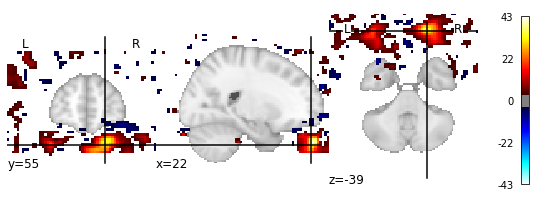

In [3]:
_, threshold = threshold_stats_img(niiAMBACImages[0].slicer[:60,:70,:60,0,4], alpha=.001, height_control='fpr')
print(threshold)
plotting.plot_stat_map(niiAMBACImages[0].slicer[:60,:70,:60,0,4], threshold=threshold)

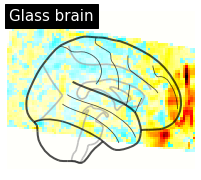

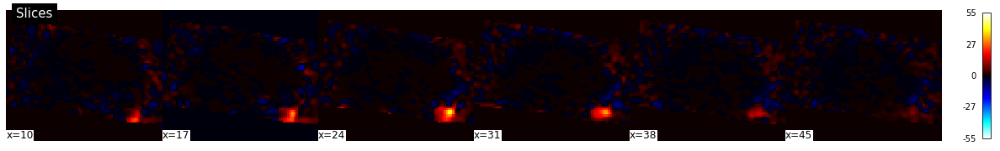

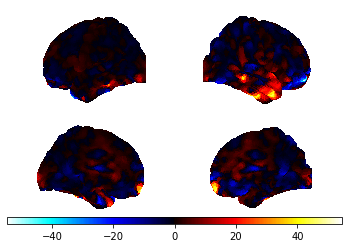

In [4]:
plotting.plot_glass_brain(niiAMBACImages[0].slicer[:,:,:,0,4], display_mode='x', plot_abs=False,
                          title='Glass brain', threshold=None)

plotting.plot_stat_map(niiAMBACImages[0].slicer[:,:,:,0,4], display_mode='x', threshold=None,
                       cut_coords=range(10, 51, 7), title='Slices')

plotting.plot_img_on_surf(niiAMBACImages[0].slicer[:,:,:,0,4],
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          colorbar=True)
plotting.show()

#Nao consigo entender porque as visualizações ficam tão diferentes

/home/marilia/.local/lib/python3.6/site-packages/nilearn/plotting/displays.py:1751: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  fraction * (x1 - x0), y1 - y0])


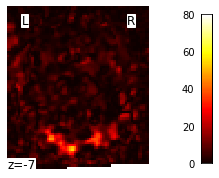

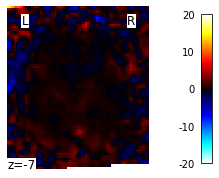

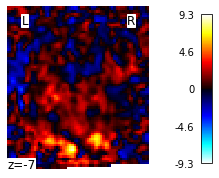

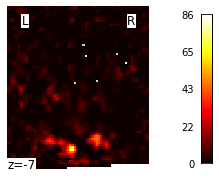

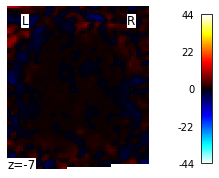

In [6]:
# selected_volumes = image.index_img(niiAMBACImages[10].slicer[:,:,:,0,:], slice(4,7))

for img in image.iter_img(niiAMBACImages[10].slicer[:,:,:,0,:5]):
    # img is now an in-memory 3D img
    plotting.plot_stat_map(img, cut_coords=[-7], display_mode='z')